In [1]:
import json
import random
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import numpy as np
import os

## 1. LOADING DATA

In [2]:
file_path = "sampled_Amazon_Fashion_v3.jsonl"

data = []
with open(file_path, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line.strip()))

df = pd.DataFrame(data)
print(df.info()) 
print(df.head())  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   main_category    10000 non-null  object 
 1   title            10000 non-null  object 
 2   average_rating   10000 non-null  float64
 3   rating_number    10000 non-null  int64  
 4   features         10000 non-null  object 
 5   description      10000 non-null  object 
 6   price            604 non-null    float64
 7   images           10000 non-null  object 
 8   videos           10000 non-null  object 
 9   store            9672 non-null   object 
 10  categories       10000 non-null  object 
 11  details          10000 non-null  object 
 12  parent_asin      10000 non-null  object 
 13  bought_together  0 non-null      object 
dtypes: float64(2), int64(1), object(11)
memory usage: 1.1+ MB
None
    main_category                                              title  \
0  AMAZON FASHIO

In [3]:
#drop unused columns
df_cleaned = df.drop(columns=["bought_together", "main_category", "categories"])


#if it's emtpy list -> convert into NA
df_cleaned[['features', 'description','details', 'images', 'videos','title']] = df_cleaned[['features', 'description','details', 'images', 'videos','title']].applymap(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)

/var/folders/91/zcsdqfxd2gb6rv2bbjt7pgcm0000gn/T/ipykernel_6810/2355923925.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_cleaned[['features', 'description','details', 'images', 'videos','title']] = df_cleaned[['features', 'description','details', 'images', 'videos','title']].applymap(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)


In [4]:
# convert 'videos' column to binary (1 if there are videos, 0 if empty)
df_cleaned["has_videos"] = df_cleaned["videos"].apply(lambda x: 1 if isinstance(x, list) and len(x) > 0 else 0)

## 2. VERBAL DATA PROCESSING

In [5]:
import textstat
import numpy as np
import spacy
import networkx as nx
from collections import Counter
import itertools
import re
from adjustText import adjust_text
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from adjustText import adjust_text

In [6]:
df_cleaned_v2 = df_cleaned.copy()

In [7]:
# convert to string while keeping NaN values
df_cleaned_v2['title'] = df_cleaned_v2['title'].astype(object).where(df_cleaned_v2['title'].notna(), np.nan)
df_cleaned_v2['features'] = df_cleaned_v2['features'].apply(lambda x: ' '.join(x) if isinstance(x, list) else (str(x) if pd.notna(x) else np.nan))
df_cleaned_v2['description'] = df_cleaned_v2['description'].apply(lambda x: ' '.join(x) if isinstance(x, list) else (str(x) if pd.notna(x) else np.nan))

In [8]:
#clean data and special characters

def clean_text(text):
    """Cleans text by removing special characters, numbers, and extra spaces."""
    if not isinstance(text, str):  # Handle missing or non-string values
        return ""

    text = text.lower()  # Convert to lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove special characters and numbers
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

df_cleaned_v2['title'] = df_cleaned_v2['title'].apply(clean_text)
df_cleaned_v2['features'] = df_cleaned_v2['features'].apply(clean_text)
df_cleaned_v2['description'] = df_cleaned_v2['description'].apply(clean_text)


### 2.1 INFORMATIVENESS SCORE 

In [9]:
# extract bigrams (attribute relationships)
nlp = spacy.load("en_core_web_sm")

def extract_bigrams(text):
    doc = nlp(text)
    bigrams = []
    
    for i in range(len(doc) - 1):
        word1, word2 = doc[i], doc[i + 1]
        
        # Keep only adjective-noun or noun-noun bigrams
        if (word1.pos_ in ["ADJ", "NOUN"]) and (word2.pos_ == "NOUN"):
            bigram = f"{word1.lemma_} {word2.lemma_}"  # Lemmatized bigram
            bigrams.append(bigram)

    return bigrams

df_cleaned_v2['bigrams_title'] = df_cleaned_v2['title'].apply(extract_bigrams)
df_cleaned_v2['bigrams_features'] = df_cleaned_v2['features'].apply(extract_bigrams)
df_cleaned_v2['bigrams_description'] = df_cleaned_v2['description'].apply(extract_bigrams)

In [10]:
# combine all bigrams into a single list
all_bigrams = df_cleaned_v2['bigrams_title'].sum() + df_cleaned_v2['bigrams_features'].sum() + df_cleaned_v2['bigrams_description'].sum()

# count frequency of each bigram
bigram_freq = Counter(all_bigrams)

# keep only frequent bigrams (threshold = 10)
frequent_bigrams = {bigram for bigram, count in bigram_freq.items() if count >= 10} 

# filter each product's bigrams
df_cleaned_v2['filtered_bigrams'] = df_cleaned_v2.apply(lambda row: [b for b in (row['bigrams_title'] + row['bigrams_features'] + row['bigrams_description']) if b in frequent_bigrams], axis=1)


In [11]:
# Social analysis network

G = nx.DiGraph()

# add bigrams as edges (modifier → noun) with frequency as weight
for bigram in df_cleaned_v2['filtered_bigrams'].sum():
    modifier, noun = bigram.split()  
    if G.has_edge(modifier, noun):
        G[modifier][noun]['weight'] += 1
    else:
        G.add_edge(modifier, noun, weight=1)


in_degree_centrality = nx.in_degree_centrality(G)
centrality_df = pd.DataFrame({"noun": list(in_degree_centrality.keys()), "in_degree_centrality": list(in_degree_centrality.values())})
centrality_df.sort_values(by="in_degree_centrality", ascending=False, inplace=True)


In [12]:
centrality_df

,noun,in_degree_centrality
33,dress,0.069620
43,shirt,0.029536
7,closure,0.027426
146,gift,0.023207
120,summer,0.023207
...,...,...
261,family,0.000000
263,tote,0.000000
265,aviator,0.000000
266,more,0.000000


In [13]:
# COMPUTE INFORMATIVENESS SCORE

# compute total word count per product
df_cleaned_v2['word_count'] = df_cleaned_v2['title'].apply(lambda x: len(x.split())) + \
                   df_cleaned_v2['features'].apply(lambda x: len(x.split())) + \
                   df_cleaned_v2['description'].apply(lambda x: len(x.split()))

# high in-degree nouns (most frequently modified attributes)
threshold = np.median(list(in_degree_centrality.values()))
important_nouns = [noun for noun, centrality in in_degree_centrality.items() if centrality >= threshold]

# cunt unique attributes per product
def count_unique_attributes(text):
    """Counts how many high-centrality attributes appear in the product text."""
    words = set(text.split())
    return sum(1 for noun in important_nouns if noun in words)

df_cleaned_v2['unique_attributes'] = df_cleaned_v2['title'].apply(count_unique_attributes) + \
                          df_cleaned_v2['features'].apply(count_unique_attributes) + \
                          df_cleaned_v2['description'].apply(count_unique_attributes)

# compute
df_cleaned_v2['informativeness_score'] = 0.5 * np.log1p(df_cleaned_v2['word_count']) + 0.5 * df_cleaned_v2['unique_attributes']

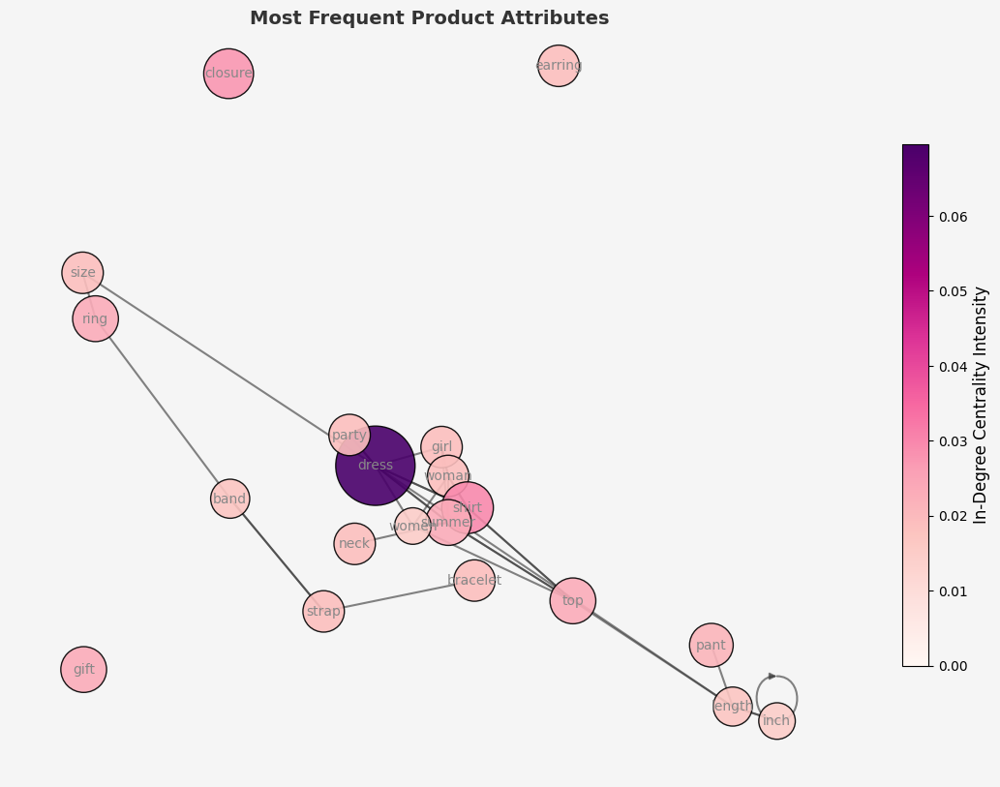

In [14]:
# top 20 most modified product attributes
top_nouns = centrality_df.head(20)['noun'].tolist()
subgraph = G.subgraph([node for node in G.nodes if node in top_nouns])

pos = nx.spring_layout(subgraph, seed=42, k=0.8)  

node_sizes = [max(in_degree_centrality[node] * 50000, 100) for node in subgraph.nodes]

#color
norm = mcolors.Normalize(vmin=min(in_degree_centrality.values()), vmax=max(in_degree_centrality.values()))
node_colors = [plt.cm.RdPu(norm(in_degree_centrality[node])) for node in subgraph.nodes]

# background
fig, ax = plt.subplots(figsize=(14, 10))
fig.patch.set_facecolor('#f5f5f5')  # Light gray-white background
ax.set_facecolor('#f5f5f5')  

# edges
nx.draw_networkx_edges(subgraph, pos, width=1.5, edge_color="#333333", alpha=0.6, arrows=False)

nx.draw_networkx_nodes(subgraph, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       edgecolors="black", alpha=0.9)

cmap = cm.RdPu
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Necessary for colorbar to work properly
cbar = plt.colorbar(sm, ax=ax, shrink=0.7, aspect=20)
cbar.set_label("In-Degree Centrality Intensity", fontsize=12)

# labels
nx.draw_networkx_labels(subgraph, pos, font_size=10, font_color="#888888")
plt.axis("off")
plt.title("Most Frequent Product Attributes", fontsize=14, fontweight="bold", color="#333333",loc="center")
plt.show()


### 2.2 READABILITY SCORE

In [15]:
def readability_score(text):
    words = text.split()
    num_words = len(words)
    num_sentences = text.count('.') + text.count('!') + text.count('?')

    # if no sentence-ending punctuation, assume at least one sentence
    num_sentences = max(1, num_sentences)
    
    num_characters = sum(len(word) for word in words)
    if num_words == 0:
        return np.nan
    
    read_score = 4.71 * (num_characters / num_words) + 0.5 * (num_words / num_sentences) - 21.43
    return max(0,read_score)

In [16]:
df_cleaned_v2['readability_title'] = df_cleaned_v2['title'].apply(readability_score)
df_cleaned_v2['readability_features'] = df_cleaned_v2['features'].apply(readability_score)
df_cleaned_v2['readability_description'] = df_cleaned_v2['description'].apply(readability_score)

# overall readability score as the average of the three columns
df_cleaned_v2['overall_readability'] = df_cleaned_v2[['readability_title', 'readability_features', 'readability_description']].mean(axis=1, skipna=True)


In [17]:
df_cleaned_v2.head(10)

,title,average_rating,rating_number,features,description,price,images,videos,store,details,...,bigrams_features,bigrams_description,filtered_bigrams,word_count,unique_attributes,informativeness_score,readability_title,readability_features,readability_description,overall_readability
0,pairs stone crystal dangle drop earrings stone...,4.2,39,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Hicarer,{'Package Dimensions': '5.47 x 3.86 x 0.67 inc...,...,[],[],"[dangle drop, drop earring, dangle earring, wo...",17,4,3.445186,15.330000,NaN,NaN,15.330000
1,aexnnzd anime cat ear hoodie unisex d printed ...,4.5,2,lace up closure hand wash only,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,[{'title': 'Should You Buy? Pikachu Hooded Tow...,AEXNNZD,{'Package Dimensions': '11.5 x 9.53 x 1.97 inc...,...,"[closure hand, hand wash]",[],"[kid boy, closure hand, hand wash]",25,10,6.629048,11.867895,1.195000,NaN,6.531447
2,ssg winter riding mittens,4.6,27,,mittens are made of leather with thinsulate li...,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,SSG,{'Item Package Dimensions L x W x H': '10 x 4 ...,...,[],"[thinsulate lining, cold weather, weather comf...",[cold weather],31,5,4.232868,6.475000,NaN,16.317778,11.396389
3,thread wallets lip balm holder cabo,4.6,39,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Thread Wallets,"{'Brand': 'Thread Wallets', 'Number of Pieces'...",...,[],[],[],6,1,1.472955,5.120000,NaN,NaN,5.120000
4,ronnox womens pairs bright colored calf compre...,4.3,3032,pull on closure size guide s fits calf inches ...,ronnox calf sleeves allowing your body to perf...,17.99,[{'thumb': 'https://m.media-amazon.com/images/...,[{'title': 'HONEST Review: RONNOX Women's 3-Pa...,RONNOX,"{'Is Discontinued By Manufacturer': 'No', 'Pac...",...,"[closure size, size guide, fit calf, calf inch...","[ronnox calf, calf sleeve, ronnox compression,...","[compression sock, compression sock, gentle cy...",398,30,17.994481,12.376667,61.199831,139.375387,70.983962
5,piercego g l stainless steel dangle belly butt...,3.8,4,imported ball closure features ancient alien a...,,8.99,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Pierce2GO,"{'Is Discontinued By Manufacturer': 'No', 'Pro...",...,"[ball closure, alien astronaut, stainless stee...",[],"[stainless steel, belly button, button ring, b...",104,18,11.326980,16.624643,39.562237,NaN,28.093440
6,michael kors nick trainer optic white m,5.0,1,rubber sole,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Michael Kors,{'Package Dimensions': '15 x 11.3 x 5.2 inches...,...,[],[],[],9,3,2.651293,4.274286,3.120000,NaN,3.697143
7,gegefur womens faux fur boot furry fluffy shor...,5.0,1,rubber sole heel measures approximately inches...,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Gegefur,{'Package Dimensions': '13.89 x 13.58 x 7.48 i...,...,"[sole heel, heel measure]",[],"[faux fur, snow boot, flat shoe, sole heel, he...",30,6,4.716994,14.346842,17.896364,NaN,16.121603
8,numbersea mother of the bride dresses with jac...,4.0,1,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Numbersea,{'Package Dimensions': '15.71 x 12.83 x 3.15 i...,...,[],[],[wedding guest],20,7,5.022261,12.355500,NaN,NaN,12.355500
9,jabasic girls school dress shoes mary jane fla...,4.5,14,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,JABASIC,{'Package Dimensions': '10.4 x 5.8 x 3.9 inche...,...,[],[],[dress shoe],9,1,1.651293,7.143333,NaN,NaN,7.143333


## 3. IMAGE DATA

### 3.1 DOWNLOAD IMAGE AND SAVE 

In [18]:
import os
import requests

In [ ]:
# def download_hi_res_images(image_data, parent_asin, save_dir="images"):

#     os.makedirs(save_dir, exist_ok=True)
#     image_paths = []
    
#     for idx, img_dict in enumerate(image_data):
#         if "hi_res" in img_dict and img_dict["hi_res"]:  # Ensure "hi_res" exists
#             url = img_dict["hi_res"]
#             filename = f"{parent_asin}_{idx}.jpg"  # Naming: parent_asin_index.jpg
#             filepath = os.path.join(save_dir, filename)

#             try:
#                 response = requests.get(url, stream=True)
#                 if response.status_code == 200:
#                     with open(filepath, "wb") as file:
#                         for chunk in response.iter_content(1024):
#                             file.write(chunk)
#                     image_paths.append(filepath)
#             except Exception as e:
#                 print(f"Failed to download {url}: {e}")
    
#     return image_paths

# for index, row in df_cleaned_v2.iterrows():
#     parent_asin = row['parent_asin']
#     image_data = row['images']  

#     print(f"\ndownloading images for product: {parent_asin}")
#     image_paths = download_hi_res_images(image_data, parent_asin)

# print("\ntest image download complete")



downloading images for product: B08CS8PW8Y

downloading images for product: B0BKRV49CF

downloading images for product: B008RMC0J2

downloading images for product: B0958RWWCQ

downloading images for product: B07SB2892S

downloading images for product: B07JQGGV8N

downloading images for product: B09J8C9MPQ

downloading images for product: B09G1358P9

downloading images for product: B09CD97DCX

downloading images for product: B07TRC25C9

downloading images for product: B017SQB566

downloading images for product: B00G5LB3Y0

downloading images for product: B0B87Y8ZG6

downloading images for product: B01MY991W3

downloading images for product: B0B1QGQC89

downloading images for product: B01MPZK8PO

downloading images for product: B01DVSZPRU

downloading images for product: B01GVE5UK8

downloading images for product: B09BD1QK2M

downloading images for product: B07Z9W8T2F

downloading images for product: B071JH5556

downloading images for product: B01N79FM1V

downloading images for product:

### 3.1 AESTHETIC SCORE (NIMA)

In [19]:
import torch
from torchvision import transforms
from PIL import Image
import torch.nn as nn
import torch.nn.functional as F
import sys
import os
from collections import defaultdict

In [20]:
os.chdir("/Users/hadoannnn/Downloads/da401")  
print("Current Working Directory:", os.getcwd())

Current Working Directory: /Users/hadoannnn/Downloads/da401


In [21]:
repo_path = os.path.abspath("image-quality-assessment/src") #go to correct path
sys.path.append(repo_path)

from handlers.model_builder import Nima
from handlers.data_generator import TestDataGenerator
from utils.utils import calc_mean_score
from tensorflow.keras.applications.mobilenet import preprocess_input


In [22]:
base_model_name = "MobileNet" 
weights_file = "image-quality-assessment/models/MobileNet/weights_mobilenet_aesthetic_0.07.hdf5"

nima = Nima(base_model_name, weights=None)
nima.build()
nima.nima_model.load_weights(weights_file)

# process an image and normalize for MobileNet
def preprocess_image(image_path):
    from tensorflow.keras.applications.mobilenet import preprocess_input

    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),  
    ])

    image_tensor = transform(image).unsqueeze(0)  
    image_tensor = image_tensor.permute(0, 2, 3, 1).numpy() 

    return preprocess_input(image_tensor) 


In [23]:
# Predict image quality (testing with 1 picture)
image_path = "images/B00A039X32_0.jpg"  
image_tensor = preprocess_image(image_path)

predictions = nima.nima_model.predict(image_tensor)
mean_score = calc_mean_score(predictions[0])

print(f"Predicted NIMA Score: {mean_score:.2f}")

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
Predicted NIMA Score: 4.03


In [24]:
image_dir = "images"
image_NIMA = {}

for image_file in os.listdir(image_dir):
    if image_file.endswith((".jpg", ".png", ".jpeg")):  
        image_path = os.path.join(image_dir, image_file)
        try:

            image_tensor = preprocess_image(image_path)
            predictions = nima.nima_model.predict(image_tensor)
            score = calc_mean_score(predictions[0])

            image_NIMA[image_file.split(".")[0]] = score

        except Exception as e:
            print(f"❌ Error processing {image_file}: {e}")

print("Processed scores:", list(image_NIMA.items())[:5])  


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

In [25]:
sorted_image_NIMA = dict(sorted(image_NIMA.items()))
sorted_image_NIMA

{'B0009EYJIQ_1': np.float64(4.046145017124218),
 'B000AS79W4_0': np.float64(4.042350549643743),
 'B000AS79W4_1': np.float64(4.041585511760786),
 'B000AS79W4_2': np.float64(4.05071312328073),
 'B000AS79W4_3': np.float64(4.027074934212578),
 'B000AS79W4_4': np.float64(4.045069916657667),
 'B000AS79W4_5': np.float64(4.019267566694907),
 'B000AS79W4_6': np.float64(4.024706251446332),
 'B000B5RWSM_0': np.float64(4.045927131428471),
 'B000B5RWSM_1': np.float64(4.035316282795975),
 'B000B5RWSM_2': np.float64(4.004061534167704),
 'B000B5RWSM_3': np.float64(4.008370724539418),
 'B000F03UGG_0': np.float64(4.026179081120063),
 'B000F03UGG_1': np.float64(4.006166308583488),
 'B000F03UGG_2': np.float64(4.030581325365347),
 'B000F03UGG_3': np.float64(4.000114747814223),
 'B000F03UGG_4': np.float64(4.00774123420706),
 'B000FGYXWU_0': np.float64(4.04012884182157),
 'B000FGYXWU_1': np.float64(4.047849547045189),
 'B000FGYXWU_2': np.float64(4.0502979579614475),
 'B000FGYXWU_3': np.float64(4.046466707208

In [26]:
product_NIMA = defaultdict(list)

for image_file, score in image_NIMA.items():
    parent_asin = image_file.split("_")[0]  
    product_NIMA[parent_asin].append(score)

# Compute the mean aesthetic per product
avg_product_NIMA = {asin: np.mean(scores) for asin, scores in product_NIMA.items()}

In [27]:
if "parent_asin" not in df_cleaned_v2.columns:
    raise ValueError("❌ Column 'parent_asin' not found in the dataset!")
df_cleaned_v2["aesthetic_score"] = df_cleaned_v2["parent_asin"].map(avg_product_NIMA).fillna(0)


### 3.3 SOCIAL PRESENCE SCORE (YOLO)

In [28]:
from ultralytics import YOLO
import cv2
import torch
from PIL import Image
import os
from collections import defaultdict

In [30]:
# COMPUTE SOCIAL SCORE 

model = YOLO("yolov8n.pt")
def compute_social_presence(image_path, conf_threshold=0.7, min_box_size=500):
    results = model(image_path)  # Run YOLO model

    for result in results:
        for box in result.boxes:
            cls = int(box.cls) 
            conf = float(box.conf)  
            x1, y1, x2, y2 = map(int, box.xyxy[0])  
            box_area = (x2 - x1) * (y2 - y1) 

            # Check if detection is for "person" and meets criteria
            if cls == 0 and conf >= conf_threshold and box_area >= min_box_size:
                return 1  

    return 0  

# test
sps = compute_social_presence("images/B00A039X32_0.jpg")
print(f"SPS score: {sps}")



image 1/1 /Users/hadoannnn/Downloads/da401/images/B00A039X32_0.jpg: 544x640 (no detections), 92.2ms
Speed: 10.4ms preprocess, 92.2ms inference, 7.6ms postprocess per image at shape (1, 3, 544, 640)
SPS score: 0


In [31]:
image_dir = "images"
image_sps = {}

for image_file2 in os.listdir(image_dir):
    image_path2 = os.path.join(image_dir, image_file2)

    try:
        sps = compute_social_presence(image_path2)
        image_sps[image_file2] = sps
    except Exception as e:
        print(f"❌ Error processing {image_file2}: {e}")


image 1/1 /Users/hadoannnn/Downloads/da401/images/B07T9RC76J_1.jpg: 608x640 (no detections), 67.6ms
Speed: 3.7ms preprocess, 67.6ms inference, 1.2ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B092SBQM51_2.jpg: 640x640 (no detections), 55.8ms
Speed: 3.8ms preprocess, 55.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B00K6IDFEO_4.jpg: 448x640 1 suitcase, 43.1ms
Speed: 2.3ms preprocess, 43.1ms inference, 11.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B08LLCD2S1_3.jpg: 640x640 1 person, 58.3ms
Speed: 3.7ms preprocess, 58.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B07K7DGGMH_3.jpg: 640x640 (no detections), 57.7ms
Speed: 3.7ms preprocess, 57.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/had

In [32]:
sorted_image_sps = dict(sorted(image_sps.items()))
sorted_image_sps

{'B0009EYJIQ_1.jpg': 0,
 'B000AS79W4_0.jpg': 0,
 'B000AS79W4_1.jpg': 0,
 'B000AS79W4_2.jpg': 0,
 'B000AS79W4_3.jpg': 0,
 'B000AS79W4_4.jpg': 0,
 'B000AS79W4_5.jpg': 0,
 'B000AS79W4_6.jpg': 0,
 'B000B5RWSM_0.jpg': 0,
 'B000B5RWSM_1.jpg': 0,
 'B000B5RWSM_2.jpg': 0,
 'B000B5RWSM_3.jpg': 0,
 'B000F03UGG_0.jpg': 0,
 'B000F03UGG_1.jpg': 0,
 'B000F03UGG_2.jpg': 0,
 'B000F03UGG_3.jpg': 0,
 'B000F03UGG_4.jpg': 0,
 'B000FGYXWU_0.jpg': 0,
 'B000FGYXWU_1.jpg': 0,
 'B000FGYXWU_2.jpg': 0,
 'B000FGYXWU_3.jpg': 0,
 'B000FGYXWU_4.jpg': 0,
 'B000FLEVLS_0.jpg': 0,
 'B000FLEVLS_1.jpg': 0,
 'B000FLEVLS_2.jpg': 0,
 'B000FLEVLS_3.jpg': 0,
 'B000FLEVLS_4.jpg': 0,
 'B000FLEVLS_5.jpg': 0,
 'B000FLEVLS_6.jpg': 0,
 'B000H772O8_0.jpg': 0,
 'B000H772O8_1.jpg': 0,
 'B000H772O8_3.jpg': 0,
 'B000H772O8_4.jpg': 0,
 'B000H772O8_5.jpg': 0,
 'B000H772O8_6.jpg': 0,
 'B000IITK3W_0.jpg': 0,
 'B000IITK3W_1.jpg': 1,
 'B000KLAV9O_0.jpg': 0,
 'B000KLAV9O_1.jpg': 0,
 'B000KLAV9O_2.jpg': 0,
 'B000KLAV9O_3.jpg': 0,
 'B000KLAV9O_4.j

In [34]:
# aggregate SPS scores by product ID or parent_asin
product_sps = defaultdict(list)

for image_file, score in image_sps.items():
    parent_asin = image_file.split("_")[0]  
    product_sps[parent_asin].append(score)

# compute the final SPS per product (if any image has human presence, score is 1, otherwise 0)
final_product_sps = {asin: int(any(scores)) for asin, scores in product_sps.items()}

# ensure 'parent_asin' is in the DataFrame
if "parent_asin" not in df_cleaned_v2.columns:
    raise ValueError("parent_asin' not found in the dataset!")

df_cleaned_v2["social_presence_score"] = df_cleaned_v2["parent_asin"].map(final_product_sps).fillna(0)


## 4. MODELS
- Independent variable
    - Continuous: 'aesthetic_score','informativeness_score', 'overall_readability'
    - Binary: 'social_presence_score', 'has_videos'

- Dependent variable: 'average_rating', 'log_rating_number'

In [35]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.multioutput import MultiOutputRegressor
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, cross_val_score
from statsmodels.multivariate.manova import MANOVA
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [36]:
# Drop unnecessary columns
df_cleaned_v3 = df_cleaned_v2.drop(columns=['bigrams_title','bigrams_features', 'bigrams_description', 'filtered_bigrams', 'word_count',
                             'unique_attributes','readability_title', 'readability_features', 'readability_description','title','features','description',
                             'price','images','store', 'details','videos'])

In [ ]:
#df_cleaned_v3.to_csv('output.csv', index=False)

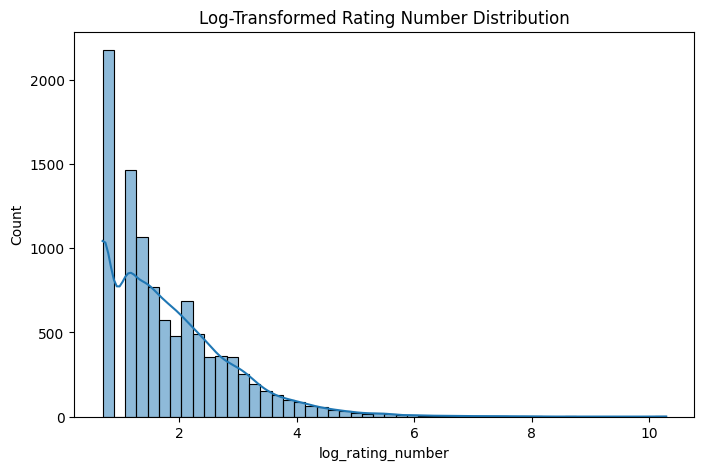

In [38]:
df_cleaned_v3['log_rating_number'] = np.log1p(df_cleaned_v3['rating_number'])  # log(1 + x) to handle 0s

plt.figure(figsize=(8,5))
sns.histplot(df_cleaned_v3['log_rating_number'], bins=50, kde=True)
plt.title("Log-Transformed Rating Number Distribution")
plt.show()


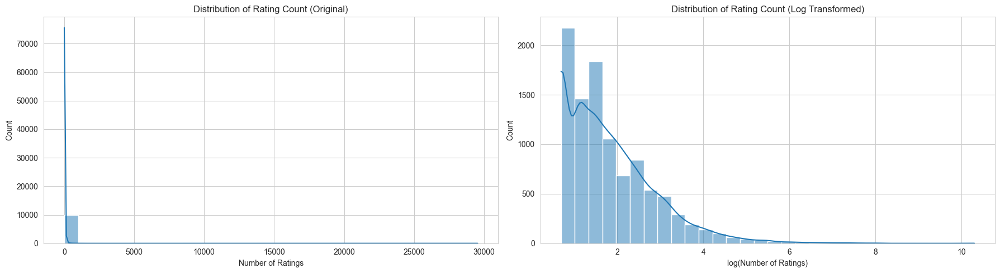

In [39]:

sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 5))

# rating count
sns.histplot(df_cleaned_v3["rating_number"], bins=30, kde=True, ax=axes[0])  # log1p(x) = log(x+1) to avoid log(0)
axes[0].set_title("Distribution of Rating Count (Original)")
axes[0].set_xlabel("Number of Ratings")

# log rating count
sns.histplot(df_cleaned_v3["log_rating_number"], bins=30, kde=True, ax=axes[1])
axes[1].set_title("Distribution of Rating Count (Log Transformed)")
axes[1].set_xlabel("log(Number of Ratings)")

plt.tight_layout()
plt.show()


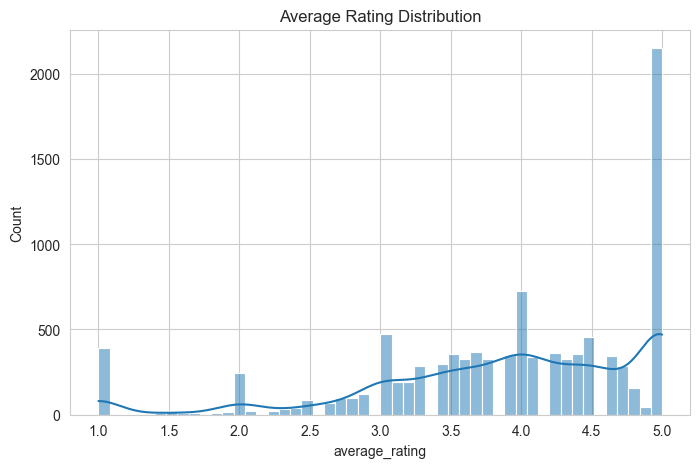

In [40]:
plt.figure(figsize=(8,5))
sns.histplot(df_cleaned_v3['average_rating'], bins=50, kde=True)
plt.title("Average Rating Distribution")
plt.show()

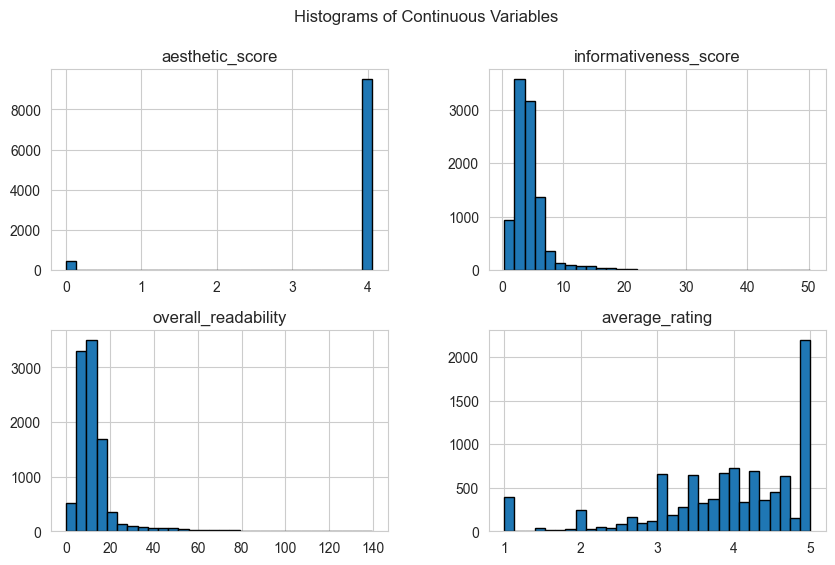

In [41]:
continuous_vars = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'average_rating']
df_cleaned_v3[continuous_vars].hist(bins=30, figsize=(10,6), edgecolor='black')
plt.suptitle("Histograms of Continuous Variables")
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


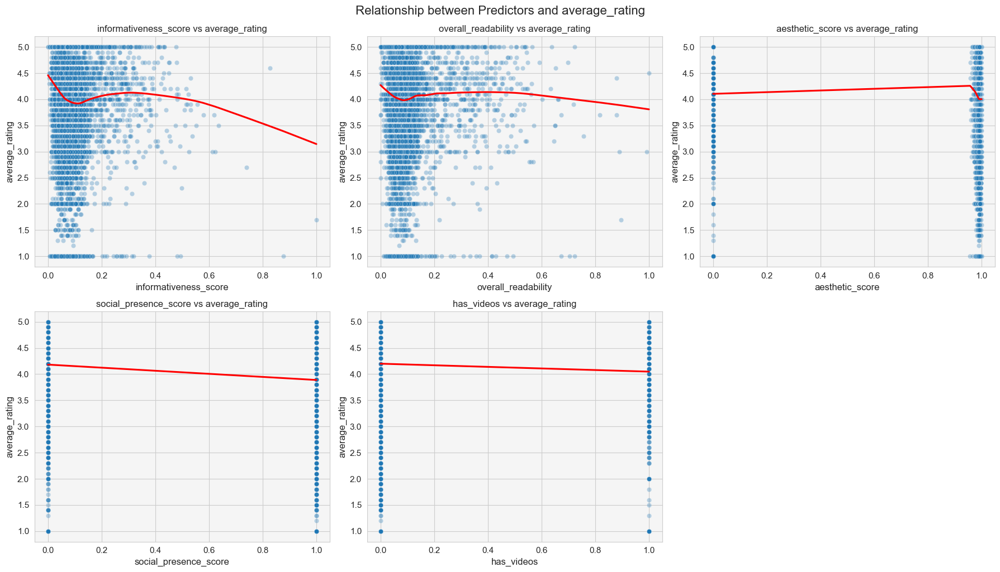

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


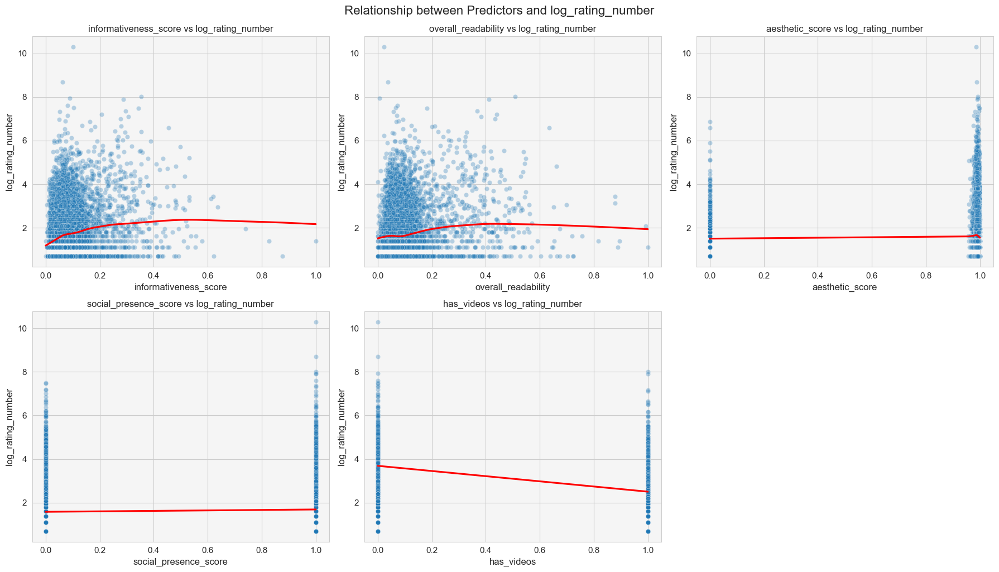

In [62]:
# List of predictors
predictors = ['informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score', 'has_videos']

# Outcomes to check
outcomes = ['average_rating', 'log_rating_number']

# Loop over outcomes separately
for outcome in outcomes:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns
    axes = axes.flatten()  # Flatten axes for easy looping

    for i, predictor in enumerate(predictors):
        sns.scatterplot(
            x=df_cleaned_v3[predictor], 
            y=df_cleaned_v3[outcome], 
            ax=axes[i], 
            alpha=0.3
        )
        sns.regplot(
            x=df_cleaned_v3[predictor], 
            y=df_cleaned_v3[outcome], 
            ax=axes[i],
            scatter=False,
            lowess=True,
            color='red'
        )
        axes[i].set_title(f'{predictor} vs {outcome}', fontsize=12)
        axes[i].set_xlabel(predictor)
        axes[i].set_ylabel(outcome)

    # Remove any empty subplots if predictors < number of subplots
    for j in range(len(predictors), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.suptitle(f'Relationship between Predictors and {outcome}', fontsize=16, y=1.02)
    plt.show()


In [42]:
df_cleaned_v3['social_presence_score'] = df_cleaned_v3['social_presence_score'].astype(int)

In [43]:
df_cleaned_v3.describe()

,average_rating,rating_number,has_videos,informativeness_score,overall_readability,aesthetic_score,social_presence_score,log_rating_number
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,3.89532,18.073500,0.061000,4.462695,12.743558,3.833494,0.541600,1.803766
std,0.99626,311.122991,0.239342,3.091865,10.243259,0.846865,0.498291,1.042669
min,1.00000,1.000000,0.000000,0.346574,0.000000,0.000000,0.000000,0.693147
25%,3.40000,2.000000,0.000000,2.782475,7.690000,4.005283,0.000000,1.098612
50%,4.00000,4.000000,0.000000,3.886294,10.679559,4.022255,1.000000,1.609438
75%,4.70000,10.000000,0.000000,5.067747,14.257050,4.035170,1.000000,2.397895
max,5.00000,29539.000000,1.000000,50.304675,139.585699,4.061825,1.000000,10.293501


In [44]:
df_cleaned_v3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_rating         10000 non-null  float64
 1   rating_number          10000 non-null  int64  
 2   parent_asin            10000 non-null  object 
 3   has_videos             10000 non-null  int64  
 4   informativeness_score  10000 non-null  float64
 5   overall_readability    10000 non-null  float64
 6   aesthetic_score        10000 non-null  float64
 7   social_presence_score  10000 non-null  int64  
 8   log_rating_number      10000 non-null  float64
dtypes: float64(5), int64(3), object(1)
memory usage: 703.3+ KB


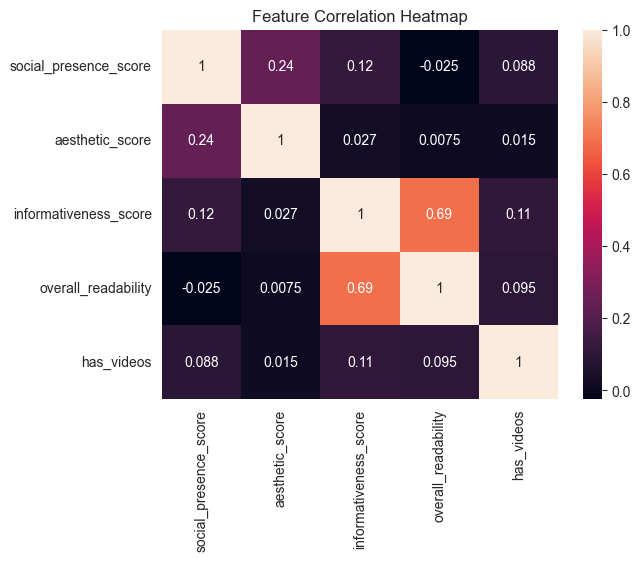

In [45]:
sns.heatmap(df_cleaned_v3[['social_presence_score', 'aesthetic_score',
                           'informativeness_score', 'overall_readability', 'has_videos']].corr(), annot=True)
plt.title("Feature Correlation Heatmap")
plt.show()

### 4.1  Polynomial Regression 

In [46]:
#define all variables 
X1 = df_cleaned_v3[['social_presence_score', 'aesthetic_score','informativeness_score', 
                    'overall_readability', 'has_videos']]
Y1= df_cleaned_v3['average_rating']  # Single DV
Y2 = df_cleaned_v3['log_rating_number']

# generate polynomial features (degree=2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X1)
feature_names = poly.get_feature_names_out(input_features=X1.columns)
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
X_poly_df = sm.add_constant(X_poly_df)

# fit OLS regression model
model1 = sm.OLS(Y1, X_poly_df).fit()
model2 = sm.OLS(Y2, X_poly_df).fit()

print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:         average_rating   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     13.01
Date:                Fri, 25 Apr 2025   Prob (F-statistic):           4.29e-39
Time:                        13:59:45   Log-Likelihood:                -14035.
No. Observations:               10000   AIC:                         2.811e+04
Df Residuals:                    9981   BIC:                         2.825e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [47]:
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:      log_rating_number   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     49.78
Date:                Fri, 25 Apr 2025   Prob (F-statistic):          9.58e-171
Time:                        13:59:52   Log-Likelihood:                -14177.
No. Observations:               10000   AIC:                         2.839e+04
Df Residuals:                    9981   BIC:                         2.853e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [67]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X_vif = df_cleaned_v3[['informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score', 'has_videos']]

# Add constant term for intercept
X_vif = add_constant(X_vif)

# Create a dataframe to hold VIF values
vif_data = pd.DataFrame()
vif_data['Feature'] = X_vif.columns
vif_data['VIF'] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

print(vif_data)

                 Feature        VIF
0                  const  23.231619
1  informativeness_score   1.988541
2    overall_readability   1.962066
3        aesthetic_score   1.062481
4  social_presence_score   1.108093
5             has_videos   1.019374


#### 4.1.1 Ridge + Lasso Regression 

In [49]:
def run_model_full(model, X, y, name):
    model.fit(X, y)
    r2 = r2_score(y, model.predict(X))
    print(f"{name}")
    print(f"Intercept: {round(model.intercept_, 4)}")
    print(f"R² Score: {round(r2, 4)}\n")

# Ridge & Lasso for Y1 (average_rating)
run_model_full(Ridge(alpha=1.0), X_poly, Y1, "Ridge (Y1 - Average Rating)")
run_model_full(Lasso(alpha=0.01, max_iter=10000), X_poly, Y1, "Lasso (Y1 - Average Rating)")

# Ridge & Lasso for Y2 (log_rating_number)
run_model_full(Ridge(alpha=1.0), X_poly, Y2, "Ridge (Y2 - Log Rating Count)")
run_model_full(Lasso(alpha=0.01, max_iter=10000), X_poly, Y2, "Lasso (Y2 - Log Rating Count)")

Ridge (Y1 - Average Rating)
Intercept: 3.9958
R² Score: 0.0229

Lasso (Y1 - Average Rating)
Intercept: 4.0041
R² Score: 0.0217

Ridge (Y2 - Log Rating Count)
Intercept: 1.203
R² Score: 0.0823

Lasso (Y2 - Log Rating Count)
Intercept: 1.3259
R² Score: 0.0795



In [50]:
def run_model(name, model_type, X, y):
    model = make_pipeline(StandardScaler(), model_type)
    model.fit(X, y)
    train_r2 = model.score(X, y)
    cv_r2 = cross_val_score(model, X, y, cv=5, scoring='r2').mean()
    coefs = model.named_steps[list(model.named_steps.keys())[-1]].coef_

    print(f"\n🔹 {name}")
    print(f"Train R²: {round(train_r2, 4)}")
    print(f"CV R² (5-fold): {round(cv_r2, 4)}")

    top_coefs = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefs
    }).sort_values(by='Coefficient', key=abs, ascending=False).head(10)

    print("\nTop Coefficients:")
    print(top_coefs.to_string(index=False))

######RUNNING MODELS
# Ridge
run_model("Ridge - Average Rating", Ridge(alpha=1.0), X_poly, Y1)
run_model("Ridge - Log Rating Count", Ridge(alpha=1.0), X_poly, Y2)

# Lasso
run_model("Lasso - Average Rating", Lasso(alpha=0.1, max_iter=10000), X_poly, Y1)
run_model("Lasso - Log Rating Count", Lasso(alpha=0.1, max_iter=10000), X_poly, Y2)



🔹 Ridge - Average Rating
Train R²: 0.0228
CV R² (5-fold): 0.02

Top Coefficients:
                                    Feature  Coefficient
                            aesthetic_score     0.880833
                          aesthetic_score^2    -0.859482
social_presence_score informativeness_score    -0.124595
  informativeness_score overall_readability     0.123551
  social_presence_score overall_readability     0.118484
        aesthetic_score overall_readability    -0.070870
                    informativeness_score^2    -0.070178
      social_presence_score aesthetic_score    -0.069913
      aesthetic_score informativeness_score     0.068016
                      informativeness_score    -0.031921

🔹 Ridge - Log Rating Count
Train R²: 0.0823
CV R² (5-fold): 0.0771

Top Coefficients:
                                  Feature  Coefficient
                          aesthetic_score     0.936870
                        aesthetic_score^2    -0.913765
    social_presence_score aesthetic_sc

### 4.2  MANOVA (Multivariate Analysis of Variance)

In [51]:
# define variables
X_manova = df_cleaned_v3[['informativeness_score', 
                    'overall_readability', 'aesthetic_score', 'social_presence_score',  'has_videos']]
Y_manova = df_cleaned_v3[['average_rating', 'log_rating_number']]
df_manova = df_cleaned_v3.copy()

# Fit the MANOVA model
manova = MANOVA.from_formula('average_rating + log_rating_number ~ informativeness_score + overall_readability + \
                             aesthetic_score + social_presence_score + has_videos', data=df_manova)
print(manova.mv_test())


                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept        Value  Num DF   Den DF   F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda 0.5764 2.0000 9993.0000 3671.4661 0.0000
         Pillai's trace 0.4236 2.0000 9993.0000 3671.4661 0.0000
 Hotelling-Lawley trace 0.7348 2.0000 9993.0000 3671.4661 0.0000
    Roy's greatest root 0.7348 2.0000 9993.0000 3671.4661 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
   informativeness_score  Value  Num DF   Den DF  F Value Pr > F
----------------------------------------------------------------
            Wilks' lambda 0.9825 2.0000 9993.0000 88.9363 0.0000
           Pillai's trace 0.0175 2.0000 9993.

In [ ]:
# import statsmodels.api as sm
# from statsmodels.formula.api import ols

# # ANOVA for 'average_rating'
# anova_avg_rating = sm.stats.anova_lm(ols('average_rating ~ social_presence_score + aesthetic_score + informativeness_score + overall_readability + has_videos', 
#                                          data=df_manova).fit(), typ=2)

# # ANOVA for 'log_rating_number'
# anova_log_rating = sm.stats.anova_lm(ols('log_rating_number ~ social_presence_score + aesthetic_score + informativeness_score + overall_readability + has_videos', 
#                                          data=df_manova).fit(), typ=2)

# print("ANOVA for Average Rating:")
# print(anova_avg_rating)

# print("\nANOVA for Log Rating Number:")
# print(anova_log_rating)


ANOVA for Average Rating:
                            sum_sq      df          F        PR(>F)
social_presence_score    87.370408     1.0  90.350869  2.775073e-21
aesthetic_score           2.318792     1.0   2.397892  1.215494e-01
informativeness_score     7.404771     1.0   7.657370  5.670704e-03
overall_readability       1.000542     1.0   1.034673  3.091029e-01
has_videos                1.419328     1.0   1.467746  2.257475e-01
Residual               6049.629422  6256.0        NaN           NaN

ANOVA for Log Rating Number:
                            sum_sq      df           F        PR(>F)
social_presence_score     0.222592     1.0    0.214262  6.434634e-01
aesthetic_score           8.055469     1.0    7.753994  5.375498e-03
informativeness_score    36.490537     1.0   35.124885  3.256918e-09
overall_readability      25.624808     1.0   24.665805  6.999235e-07
has_videos              254.659253     1.0  245.128677  3.170831e-54
Residual               6499.232570  6256.0         NaN

### 4.3 XGBOOST

In [52]:
from xgboost import XGBRegressor

In [53]:
# define variables
X_xg = df_cleaned_v3[['has_videos', 'informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score']]
Y1_xg = df_cleaned_v3['average_rating']
Y2_xg = df_cleaned_v3['log_rating_number']

# average_rating
xgb_rating = XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)
xgb_rating.fit(X_xg, Y1_xg)

# log_rating_number
xgb_log_rating = XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)
xgb_log_rating.fit(X_xg, Y2_xg)

# extract feature importance
importance_rating = pd.DataFrame({'Feature': X_xg.columns, 'Importance': xgb_rating.feature_importances_})
importance_log_rating = pd.DataFrame({'Feature': X_xg.columns, 'Importance': xgb_log_rating.feature_importances_})

importance_rating = importance_rating.sort_values(by='Importance', ascending=False)
importance_log_rating = importance_log_rating.sort_values(by='Importance', ascending=False)

print("XGBoost Feature Importance (Predicting Average Rating)")
print(importance_rating)

print("\n XGBoost Feature Importance (Predicting Log Rating Number)")
print(importance_log_rating)


XGBoost Feature Importance (Predicting Average Rating)
                 Feature  Importance
4  social_presence_score    0.377953
2    overall_readability    0.186813
3        aesthetic_score    0.180885
1  informativeness_score    0.167459
0             has_videos    0.086890

 XGBoost Feature Importance (Predicting Log Rating Number)
                 Feature  Importance
0             has_videos    0.455361
1  informativeness_score    0.156298
4  social_presence_score    0.135056
3        aesthetic_score    0.130373
2    overall_readability    0.122911


In [54]:
from sklearn.model_selection import cross_val_score, KFold

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores_rating = cross_val_score(xgb_rating, X_xg, Y1_xg, cv=kf, scoring='r2')
cv_scores_log_rating = cross_val_score(xgb_log_rating, X_xg, Y2_xg, cv=kf, scoring='r2')

print(cv_scores_rating)
print(cv_scores_log_rating)

[  -0.095498    -0.10576    -0.14664    -0.11842    -0.11672]
[  -0.056273   -0.029936   -0.096989   -0.057077    -0.05983]


### 4.4 Multiple Linear Regression (OLS)

In [55]:
# variable
X_lin = df_cleaned_v3[['informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score',  'has_videos']]
X_lin = sm.add_constant(X_lin)

Y1_lin = df_cleaned_v3['average_rating']
Y2_lin = df_cleaned_v3['log_rating_number']

# Run regression for Y1
model_Y1_lin = sm.OLS(Y1_lin, X_lin).fit()

# Run regression for Y2
model_Y2_lin = sm.OLS(Y2_lin, X_lin).fit()

print(model_Y1_lin.summary())
print(model_Y2_lin.summary())

                            OLS Regression Results                            
Dep. Variable:         average_rating   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     38.68
Date:                Fri, 25 Apr 2025   Prob (F-statistic):           1.78e-39
Time:                        14:00:25   Log-Likelihood:                -14056.
No. Observations:               10000   AIC:                         2.812e+04
Df Residuals:                    9994   BIC:                         2.817e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     3.95

In [56]:
print(model_Y2_lin.summary())

                            OLS Regression Results                            
Dep. Variable:      log_rating_number   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     139.4
Date:                Fri, 25 Apr 2025   Prob (F-statistic):          2.35e-143
Time:                        14:00:41   Log-Likelihood:                -14270.
No. Observations:               10000   AIC:                         2.855e+04
Df Residuals:                    9994   BIC:                         2.859e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     1.39

In [57]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

vif_linear = calculate_vif(X_lin)
print("VIF for Linear Regression:")
print(vif_linear)

VIF for Linear Regression:
                 Feature        VIF
0                  const  23.420440
1  informativeness_score   1.988541
2    overall_readability   1.962066
3        aesthetic_score   1.062481
4  social_presence_score   1.108093
5             has_videos   1.019374


## 5. VISUALIZATION

In [58]:
from sklearn.preprocessing import MinMaxScaler

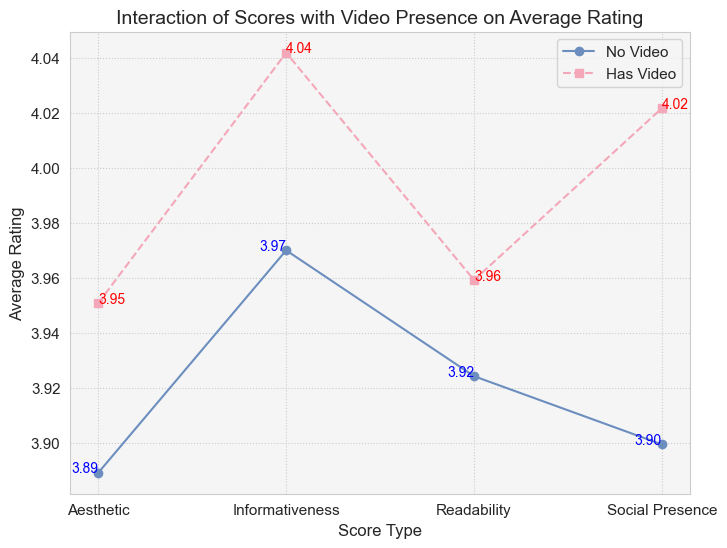

In [59]:
score_columns = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'social_presence_score']

# normalize scores 
scaler = MinMaxScaler()
df_cleaned_v3[score_columns] = scaler.fit_transform(df_cleaned_v3[score_columns])

# mean `average_rating` for each score type based on 'has_videos'
means_no_video = []
means_has_video = []

for score in score_columns:
    means_no_video.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['average_rating'].mean().mean())
    means_has_video.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['average_rating'].mean().mean())

score_types = ['Aesthetic', 'Informativeness', 'Readability', 'Social Presence']

# plot style
sns.set_style("whitegrid")  # Light grid background
plt.rcParams['axes.facecolor'] = '#f5f5f5'

plt.rcParams.update({
    "font.family": "Arial",
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11
})

plt.figure(figsize=(8,6))
plt.plot(score_types, means_no_video, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
plt.plot(score_types, means_has_video, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# Plot Interaction Effect with Confidence Intervals
# plt.figure(figsize=(8,6))
# plt.errorbar(score_types, means_no_video, yerr=std_err_no_video, fmt='o-', label="No Video", color='blue', capsize=5)
# plt.errorbar(score_types, means_has_video, yerr=std_err_has_video, fmt='s--', label="Has Video", color='red', capsize=5)

# value lables
for i, txt in enumerate(means_no_video):
    plt.text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video):
    plt.text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')


plt.xlabel("Score Type")
plt.ylabel("Average Rating")  
plt.title("Interaction of Scores with Video Presence on Average Rating")
plt.legend()
plt.grid(True, linestyle='dotted')

plt.show()


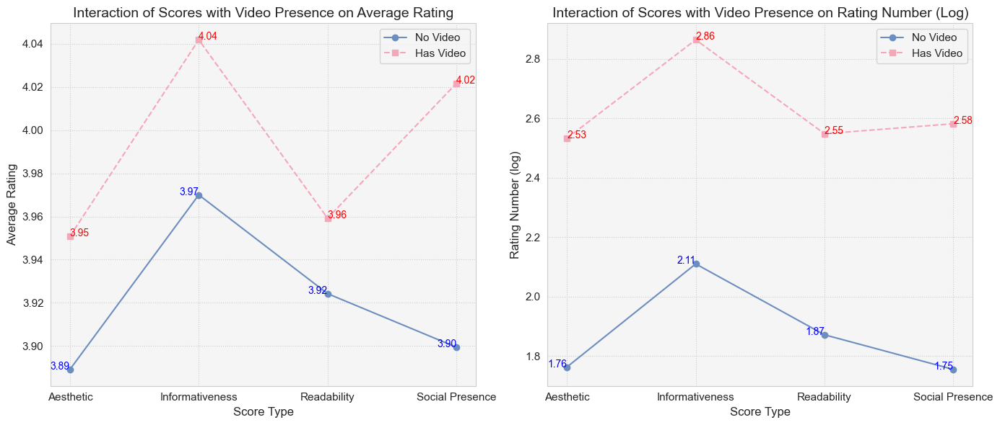

In [60]:
score_columns = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'social_presence_score']

# normalize scores 
scaler = MinMaxScaler()
df_cleaned_v3[score_columns] = scaler.fit_transform(df_cleaned_v3[score_columns])

# compute mean `average_rating` and `log_rating_number` for each score type based on 'has_videos'
means_no_video_avg = []
means_has_video_avg = []
means_no_video_log = []
means_has_video_log = []

for score in score_columns:
    means_no_video_avg.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['average_rating'].mean().mean())
    means_has_video_avg.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['average_rating'].mean().mean())
    
    means_no_video_log.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['log_rating_number'].mean().mean())
    means_has_video_log.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['log_rating_number'].mean().mean())

score_types = ['Aesthetic', 'Informativeness', 'Readability', 'Social Presence']

# style
sns.set_style("whitegrid")  
plt.rcParams['axes.facecolor'] = '#f5f5f5'  #
plt.rcParams.update({
    "font.family": "Arial",
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11
})
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# average rating plot
axes[0].plot(score_types, means_no_video_avg, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
axes[0].plot(score_types, means_has_video_avg, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# value labels
for i, txt in enumerate(means_no_video_avg):
    axes[0].text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video_avg):
    axes[0].text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')

axes[0].set_xlabel("Score Type")
axes[0].set_ylabel("Average Rating")
axes[0].set_title("Interaction of Scores with Video Presence on Average Rating")
axes[0].legend()
axes[0].grid(True, linestyle='dotted')

# log rating plot
axes[1].plot(score_types, means_no_video_log, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
axes[1].plot(score_types, means_has_video_log, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# value labels
for i, txt in enumerate(means_no_video_log):
    axes[1].text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video_log):
    axes[1].text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')

axes[1].set_xlabel("Score Type")
axes[1].set_ylabel("Rating Number (log)")
axes[1].set_title("Interaction of Scores with Video Presence on Rating Number (Log)")
axes[1].legend()
axes[1].grid(True, linestyle='dotted')
plt.tight_layout()
plt.show()
